# Introduction

Check the readme files in the folder to learn how to run scans and use defaults vs specify parameters

# Initialize

In [1]:
cfg_file='snowbird_many_modes.yml' # Configuration file name
expt_path = 'C:\\_Data\\snowbird_mm\\' # Experiment data path

max_t1 = 250 # Maximum T1 to consider when doing experiments (in us)

## Imports

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm

np.set_printoptions(legacy="1.25")
from qick import QickConfig

from slab_qick_calib.exp_handling.instrumentmanager import InstrumentManager
import slab_qick_calib.experiments as meas
from slab_qick_calib.calib import qubit_tuning, measure_func
from slab_qick_calib.calib.time_tracking import time_tracking
from slab_qick_calib.analysis import qubit_params 
from slab_qick_calib.helpers import qick_check, config, handy

%load_ext autoreload
%autoreload 2

# Set color palette and font size
handy.config_figs()

<module 'slab_qick_calib.experiments' from 'C:\\_Lib\\python\\qq\\slab_qick_calib\\experiments\\__init__.py'>
C:\_Lib\python\qq\slab_qick_calib\experiments
imported slab_qick_calib.experiments.general.qick_experiment
imported slab_qick_calib.experiments.general.qick_experiment_2q
imported slab_qick_calib.experiments.general.qick_program
C:\_Lib\python\qq\slab_qick_calib\experiments\general
C:\_Lib\python\qq\slab_qick_calib\experiments\single_qubit
imported slab_qick_calib.experiments.single_qubit.active_reset
imported slab_qick_calib.experiments.single_qubit.pulse_probe_spectroscopy
imported slab_qick_calib.experiments.single_qubit.rabi
imported slab_qick_calib.experiments.single_qubit.resonator_spectroscopy
imported slab_qick_calib.experiments.single_qubit.single_shot
imported slab_qick_calib.experiments.single_qubit.single_shot_opt
imported slab_qick_calib.experiments.single_qubit.stark_spectroscopy
imported slab_qick_calib.experiments.single_qubit.t1
imported slab_qick_calib.experim

In [3]:
import qick

In [4]:
qick.__version__

'0.2.360'

## Set up new config 
Set to variables to True when setting up a new experiment config file. 

Note: make sure you set your ADC/DAC channels correctly. This code does not automatically fill in the ADC/DAC into your configuration file, so you should check yourself to make sure these values are correct. 

There are several elements that you may want to customize based on your readout parameters and coherence times. Check readme file config_manual.md

In [5]:
# Set to false if you aren't creating a new one
new_config = False
new_folder = False

nqubits = 4
rfsoc_alias = 'bf1_soc'
t1_guess = 50 
ip = '10.108.30.23' # ip address of name server that rfsoc is connected to 
import os

configs_dir = os.path.join(os.getcwd(),'../', 'configs')

cfg_file_path = os.path.join(configs_dir, cfg_file)
images_dir = os.path.join(expt_path, 'images')
summary_dir = os.path.join(images_dir, 'summary')

if new_config or new_folder:
    if new_config:
        config.init_config(cfg_file_path, nqubits, type='full', aliases=rfsoc_alias, t1=t1_guess, ip=ip)
        config.init_model_config(cfg_file_path, nqubits)


    if not os.path.exists(expt_path):
        os.makedirs(expt_path)
        os.mkdir(images_dir)
        os.mkdir(summary_dir)

print('Data will be stored in', expt_path)

Data will be stored in C:\_Data\snowbird_mm\


## Connect to RFSoC
Before running first cell, make sure a nameserver is running on the network, the Qick board is connected to it, and the ip address listed below matches that of the nameserver. 

You just need to run the first cell, then should be able to run any other cell in whatever order. 

If you need to restart the RFSoC, you should reconnect it to the nameserver and rerun this. 

In [6]:
# Results config file
cfg_path = os.path.join(os.getcwd(),'..', 'configs', cfg_file)
auto_cfg = config.load(cfg_path)

# Connect to instruments
im = InstrumentManager(ns_address=auto_cfg['aliases']['ip'])
print(im)

soc = im[auto_cfg['aliases']['soc']]
soccfg = QickConfig(soc.get_cfg())

cfg_dict = {'soc': soccfg, 'expt_path': expt_path, 'cfg_file': cfg_path, 'im': im}

{'Pyro.NameServer': <Pyro4.core.Proxy at 0x2700c1f3a10; not connected; for PYRO:Pyro.NameServer@10.108.30.23:9090>, 'bf1_soc': <Pyro4.core.Proxy at 0x2700bd4d220; not connected; for PYRO:obj_828b5713123e462280025478eae7b3f1@10.108.30.74:45249>, 'bf3_soc': <Pyro4.core.Proxy at 0x2700bd31d00; not connected; for PYRO:obj_c40c7cb3b5fa4aba8f020c8092a0a031@10.108.30.27:39965>}


In [7]:
print(soccfg)
# ADC 10
# DAC 0 / 1/ 2 /3  

QICK running on ZCU216, software version 0.2.360

Firmware configuration (built Sun Jun 15 22:25:25 2025):

	Global clocks (MHz): tProc dispatcher timing 430.080, RF reference 245.760
	Groups of related clocks: [tProc core clock, tProc timing clock, DAC tile 1, DAC tile 2, DAC tile 3], [DAC tile 0], [ADC tile 1, ADC tile 2]

	16 signal generator channels:
	0:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 65536 complex samples (6.838 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 0 is 0_228 on JHC1, or QICK box DAC port 0
	1:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 16384 complex samples (1.709 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 1 is 1_228 on JHC2, or QICK box DAC port 1
	2:	axis_signal_gen_v6 - fs=9584.640 Msps, fabric=599.040 MHz
		envelope memory: 32768 complex samples (3.419 us)
		32-bit DDS, range=9584.640 MHz
		DAC tile 0, blk 2 is 2_228 on JHC1, or QICK box DAC port 2
	3:	axis_signal_ge

## Check QICK issues

### Check mirror frequencies on qubit

In [8]:
qick_check.check_freqs(0, cfg_dict)

Nyquist frequency: 4792.32 MHz
Possible g-e frequencies: 4000 MHz and 5584.639999999999 MHz
Possible e-f frequencies: 3800 MHz and 5784.639999999999 MHz
Anharmonicity: 200 MHz. With aliased e-f: -1784.6399999999994 MHz
Aliased e-f frequency is greater than both g-e frequencies.
Recommendation: Current e-f frequency is the correct choice.


### Check mirror frequencies from resonators

In [9]:
qick_check.check_resonances(cfg_dict)

Nyquist frequency: 4792.32 MHz
Configured resonator frequencies (MHz):
7152.435
7705.0
8345.7102
3982.79
Aliased resonator frequencies (MHz):
2432.204999999999
1879.6399999999994
1238.9298
5601.849999999999


### Check sampling rates and minimum point spacing

In [10]:

fnyq = cfg_dict['soc']._get_ch_cfg(ro_ch=0)['f_dds']/2
clock_tick = 1e3*cfg_dict['soc'].cycles2us(1)
print(f'ADC Nyquist frequency is {fnyq} MHz')
print(f'1 clock tick is {clock_tick} ns')

ADC Nyquist frequency is 1228.8 MHz
1 clock tick is 2.3251488095238093 ns


### Make sure you're not near the nyquist frequency of the ADC

In [11]:
qick_check.check_adc(cfg_dict)

ADC sampling frequency: 2457.6


# Set on board attenuation and filter

In [290]:
# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 0, 0)
soc.rfb_set_gen_rf(1, 0, 0)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(0, 0)

0.0

In [291]:
# Clear filters
soc.rfb_set_gen_filter(0, fc=0, ftype='bypass')
soc.rfb_set_gen_filter(1, fc=0, ftype='bypass')
soc.rfb_set_ro_filter(0, fc=0, ftype='bypass')

In [111]:
# freq = 6700 # center frequency in MHz
# bw = 500 # bandwidth in MHz

# Set band pass filters
# soc.rfb_set_ro_filter(10, fc=freq/1000, ftype='bandpass', bw=bw/1000) # ADC channel 10
# soc.rfb_set_gen_filter(0, fc=freq/1000, ftype='bandpass', bw=bw/1000) # DAC channel 0

# Time of Flight (TOF)

TOF measures the time it takes for the signal to run through the wires. It will give us the time in clock ticks that we should wait to make a measurements 

 Use this to set trig_offset in config file

  0%|          | 0/1000 [00:00<?, ?it/s]

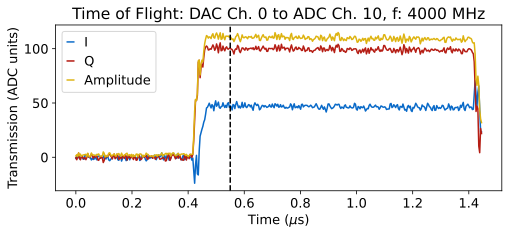

In [293]:
qubit_list = np.arange(3)
qubit_list = [0]
for qi in qubit_list:  
        # tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi)

        # Set frequency of choice and readout length (up to 13 us for standard ZCU216 firmware, readout)
        tof=meas.ToFCalibrationExperiment(cfg_dict=cfg_dict, qi=qi, params={'frequency':4000})

## Set trig_offset to point where signal has appeared, usually around 300-500 ns

In [27]:
qubit_list=np.arange(3)
for qi in qubit_list: 
    auto_cfg = config.update_readout(cfg_path, 'trig_offset', 0.55, qi)

*Set cfg device.readout 0 trig_offset to 0.55 from 0.55*
*Set cfg device.readout 1 trig_offset to 0.55 from 0.55*
*Set cfg device.readout 2 trig_offset to 0.55 from 0.55*


## Collect many time traces of TOF data (for examining measurement data)

check_e first prepares e state

In [ ]:
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13})
tof2d = meas.ToF2D(cfg_dict=cfg_dict, qi=qi, params={'expts_count':10000, 'readout_length': 13,'check_e':True})

# Power calibration

In [ ]:
# the main program class
from qick.asm_v2 import AveragerProgramV2
class SimpleSweepProgram2(AveragerProgramV2):
    def _initialize(self, cfg):
        ro_ch = cfg['ro_ch']
        gen_ch = cfg['gen_ch']
        
        self.declare_gen(ch=gen_ch, nqz=cfg['nqz'])
        self.declare_readout(ch=ro_ch, length=cfg['ro_len'])

        self.add_loop("myloop", self.cfg["steps"])
        self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch)

        #self.add_gauss(ch=gen_ch, name="ramp", sigma=cfg['ramp_len']/10, length=cfg['ramp_len'], even_length=True)
        self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
                       style="const", 
                       #envelope="ramp", 
                       freq=cfg['freq'], 
                       length=cfg['len'],
                       phase=cfg['phase'],
                       gain=cfg['gain'], 
                        mode = "periodic"
                      )

        
        self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        
    def _body(self, cfg):
        self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)
        self.trigger(ros=[cfg['ro_ch']], t=cfg['trig_time'])


In [278]:
# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 0, 0)
soc.rfb_set_gen_rf(1, 0, 0)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(10, 0)

0.0

In [295]:
# do a sweep with 5 points and plot decimated
config = {'steps': 5,
          'gen_ch': 1,
          'ro_ch': 10,
          'freq': 4000,
          #'mixer_freq': 1400,
            'nqz': 1,
          'trig_time': 0.45,
          'ro_len': 0.3,
          'len': 0.05,
          'ramp_len': 0.2,
          'phase': 0.0,
          'gain': 0 # 0.002
         }

prog = SimpleSweepProgram2(soccfg, reps=1, final_delay=0.5, cfg=config)

iq_list = prog.acquire(soc, rounds=1)

  0%|          | 0/5 [00:00<?, ?it/s]

# RF on board Bias Port

In [11]:
soc.rfb_set_bias(0,0.0)

0.0

# Resonator Spectroscopy 

Run resonator spectroscopy for all resonators by choosing a large frequency scan to look over. The scan will then find the different resonators and fill in the config file with their respective frequencies. In the autocalibration, there will be a finer sweep of each resonator to more accurately find its frequency. The frequencies are saved in <code>auto_cfg.device.readout.frequency</code>

## Coarse 

This will perform peak finding
Use params to specify frequency range, averaging, gain, expts. 
If gain is too high, you may be in punch out region, where resonators disappear, or above it 

### Set filters

In [270]:
freq = 4000 # center frequency in MHz
bw = 100 # bandwidth in MHz

# Set band pass filters
soc.rfb_set_ro_filter(10, fc=freq/1000, ftype='bandpass', bw=bw/1000) # ADC channel 10
soc.rfb_set_gen_filter(1, fc=freq/1000, ftype='bandpass', bw=bw/1000) # DAC channel 0

In [279]:
# Clear filters
soc.rfb_set_gen_filter(1, fc=0, ftype='bypass')
soc.rfb_set_gen_filter(0, fc=0, ftype='bypass')
soc.rfb_set_ro_filter(10, fc=0, ftype='bypass')

In [31]:
# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 0, 0)
soc.rfb_set_gen_rf(1, 0, 0)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(10, 0)

0.0

### Res 

In [301]:
qi=3 # We only run this once for all qubits on a single feedline, this is a dummy value to make the scan work 
params={'start':3570, 'span':50, 'reps':100, 'gain':0.01, 'expts':1000}
rspecc = meas.ResSpec(cfg_dict, qi=qi, style='coarse', progress=True, params=params)
res_values = rspecc.data['coarse_peaks']

  0%|          | 0/200 [00:00<?, ?it/s]

ValueError: attempt to get argmin of an empty sequence

### Change prom (prominence value) to adjust how many peaks you find

In [ ]:
rspecc.analyze(peaks=True, debug=True, fit=False, prom=0.065)
rspecc.display(peaks=True, fit=False)
res_values = rspecc.data['coarse_peaks']

In [75]:
res_values[0]

3982.7474121093746

Can delete values from res_values if they don't seem to be real res_values. 

In [46]:
res_values = np.delete(res_values, 0)

## Fine

This will fit the resonance amplitude

Can run scan with default options, or specify your own, by commenting out different lines and editing paramters. 

### First time after running coarse scan, using res_values list
Assumes you have the same number of res_values as qubits. 
First time you run scan, plot will appear weird first because it plots the resonator frequency in the config on the same plot. Just run again

In [ ]:
update=False

num_peaks = len(res_values)

for qi in  range(1,len(res_values)):    
    # Used for initial finding of resonance 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':5, 'center':res_values[qi]}, disp_kwargs={'plot_res':False})

    if update: rspec.update()

### Fine resonator scan

Once the correct frequencies are saved to your config file. 

In [728]:
soc.rfb_set_ro_rf(10, 10)

10.0

  0%|          | 0/100100 [00:00<?, ?it/s]

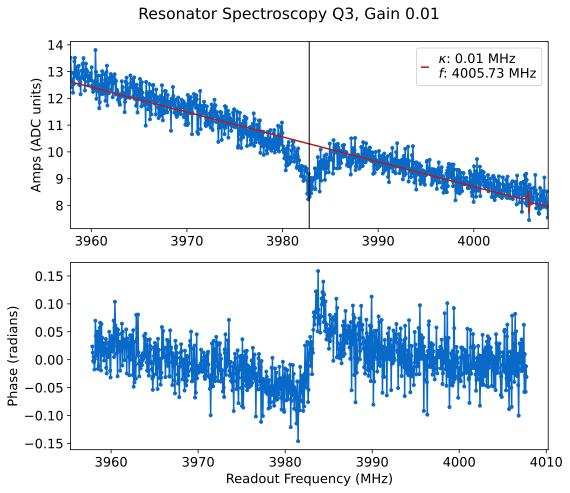

In [237]:
update=False # Set to true if you want to update the config file with the new resonance values

# comment out one of these 
# qubit_list = np.arange(3)
qubit_list=[3]

res_freq = 3982 # center frequency in MHz
bw = 100 # bandwidth in MHz

# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 5, 25)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(0, 30)

# Set band pass filters
soc.rfb_set_ro_filter(10, fc=res_freq/1000, ftype='bandpass', bw=bw/1000) # ADC channel 10
soc.rfb_set_gen_filter(0, fc=res_freq/1000, ftype='bandpass', bw=bw/1000) # DAC channel 0

for qi in qubit_list:    
    # Manually set the span and gain 
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'start': 3579, 'span':20, 'gain':0.01, 'reps':100, 'expts':1001, "final_delay":1})

    # Fully automated, using previous fit to kappa to set span
    # rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
    if update: rspec.update()

# Test filters

In [ ]:
import time


# comment out one of these 
# qubit_list = np.arange(3)
qubit_list=[3]

res_freq = 3982 # center frequency in MHz
res_freq = 4350
# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 0, 0)
soc.rfb_set_gen_rf(1, 0, 0)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(10, 0)

# Set band pass filters
bandwidth = np.array([0.1, 0.48,0.74, 1, 1.25])*1000
d=[]

for qi in qubit_list:    
    for bw in bandwidth:
        d.append([])
        bw=int(bw)
        soc.rfb_set_ro_filter(10, fc=res_freq/1000, ftype='bandpass', bw=bw/1000) # ADC channel 10
        for bw2 in bandwidth:
            print(f"ADC filter BW:{bw}")
            print(f"DAC filter BW: {bw2}")
            bw2=int(bw2)
        
            soc.rfb_set_gen_filter(0, fc=res_freq/1000, ftype='bandpass', bw=bw2/1000) # DAC channel 0
            time.sleep(1)
            
            # Manually set the span and gain 
            #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':20, 'gain':1, 'reps':10000})

            # Fully automated, using previous fit to kappa to set span
            rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':1000, 'expts':1000})
            d[-1].append(rspec)


In [513]:
type(soc)

Pyro4.core.Proxy

In [ ]:
soc._pyroMethods

In [16]:
from qick.asm_v2 import QickSweep1D

In [23]:
class FreqSweepProgram(AveragerProgramV2):
    def _initialize(self, cfg):
        ro_ch = cfg['ro_ch']
        gen_ch = cfg['gen_ch']
        
        self.declare_gen(ch=gen_ch, nqz=cfg['nqz'], ro_ch=ro_ch)#mixer_freq=cfg['mixer_freq'], ro_ch=ro_ch)
        self.declare_readout(ch=ro_ch, length=cfg['ro_len'])

        self.add_loop("myloop", self.cfg["steps"])
        self.add_readoutconfig(ch=ro_ch, name="myro", freq=cfg['freq'], gen_ch=gen_ch)

        self.add_pulse(ch=gen_ch, name="mypulse", ro_ch=ro_ch, 
                       style="const", 
                       freq=cfg['freq'], 
                       length=cfg['pulse_len'],
                       phase=cfg['phase'],
                       gain=cfg['gain'], 
                      )
        
    def _body(self, cfg):
        # if you delay the config by too long, you can see the readout get reconfigured in the middle of your pulse
        self.send_readoutconfig(ch=cfg['ro_ch'], name="myro", t=0)
        self.pulse(ch=cfg['gen_ch'], name="mypulse", t=0)
        self.trigger(ros=[cfg['ro_ch']], pins=[0], t=cfg['trig_time'])


In [18]:
def measure_s21(gen_ch, ro_ch, nqz, gain,
                steps=2001,
                f_center_MHz=3982,
                span_MHz=1500,
                plot=False, progress=True):

    f_start = f_center_MHz - span_MHz/2
    f_stop  = f_center_MHz + span_MHz/2

    config = {
        'steps': steps,
        'gen_ch': gen_ch,
        'ro_ch': ro_ch,
        'nqz': nqz,
        'trig_time': 0.4,
        'pulse_len': 10.0,
        'ro_len': 5.0,
        'phase': 0,
        'gain': gain,
        #'mixer_freq': 0.0,
    }

    # sweep directly over the desired RF band (in MHz)
    config['freq'] = QickSweep1D("myloop", f_start, f_stop)

    prog = FreqSweepProgram(soccfg, reps=100, final_delay=1.0, cfg=config)
    freqs = prog.get_pulse_param('myro', 'freq', as_array=True)

    iq_list = prog.acquire(soc, rounds=1, progress=progress)
    iq_complex = iq_list[0][0].dot([1, 1j])

    mags = np.abs(iq_complex)
    powers = 20*np.log10(mags)

    if plot:
        plt.plot(freqs, powers)
        plt.ylabel("S21 [arb. dB]")
        plt.xlabel("Frequency [MHz]")

    return freqs, powers


## Test power

ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


0
0


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


5
0


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


15
0


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


20
0


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


25
0


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


30
0


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


30
5


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


30
10


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


30
15


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


30
20


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


30
25


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


30
30


ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


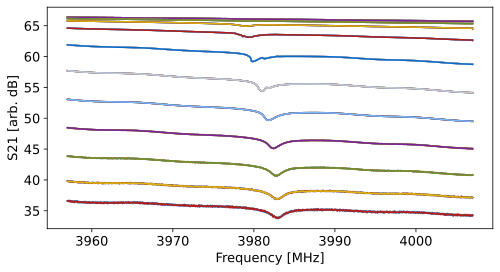

In [24]:
GEN_CH = 0
RO_CH = 0
nqz = 2
center_freq = 3982
bw = 100

gen_atten = np.array([0, 5, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60])
ro_atten_list = np.array([0, 5, 15, 20, 25, 30])
#gain_list = np.logspace(-3,0,21)
gain_list = np.array([1])

soc.rfb_set_ro_filter(RO_CH, fc=center_freq/1000, ftype='bandpass', bw=bw/1000)
soc.rfb_set_gen_filter(GEN_CH, fc=center_freq/1000, ftype='bandpass', bw=bw/1000)

results = {}

for gen_atten in gen_atten:
    if gen_atten<=30:
        gen_atten_1 = gen_atten
        gen_atten_2 = 0
        print(gen_atten_1)
        print(gen_atten_2)
    else:
        gen_atten_2 = gen_atten - 30
        gen_atten_1 = 30
        print(gen_atten_1)
        print(gen_atten_2)
    for ro_atten in ro_atten_list:
        for gain in gain_list:
            # Set attenuators
            soc.rfb_set_gen_rf(GEN_CH, int(gen_atten_1), int(gen_atten_2))
            soc.rfb_set_ro_rf(RO_CH, int(ro_atten))
            
            # Measure S21
            f, p = measure_s21(GEN_CH, RO_CH, nqz, gain, 
                                steps=1001, f_center_MHz=center_freq, 
                                span_MHz=50, plot=True, progress=False)
            
            # Store results
            key = (gen_atten, ro_atten, gain)
            results[key] = {'freq': f, 'power': p}

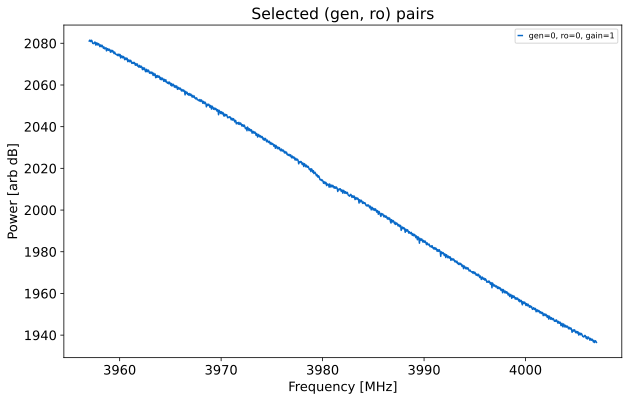

In [25]:
pairs = [(0, 0)]  

plt.figure(figsize=(10, 6))

for (gen_fixed, ro_fixed) in pairs:
    # collect all keys that match this pair
    matched = [((gen_atten, ro_atten, gain), d)
               for (gen_atten, ro_atten, gain), d in results.items()
               if gen_atten == gen_fixed and ro_atten == ro_fixed]

    # optional: sort by gain so legend/lines are ordered
    matched.sort(key=lambda x: float(x[0][2]))

    for (gen_atten, ro_atten, gain), d in matched:
        f = np.ravel(d["freq"])
        p = np.ravel(d["power"])
        plt.plot(f, 10**(p/20), label=f"gen={gen_fixed}, ro={ro_fixed}, gain={gain}")

plt.xlabel("Frequency [MHz]")
plt.ylabel("Power [arb dB]")
plt.title("Selected (gen, ro) pairs")
plt.legend(fontsize=8)
plt.show()


In [208]:
import pickle

with open("results_gain1_channel0.pkl", "wb") as f:
    pickle.dump(results, f, protocol=pickle.HIGHEST_PROTOCOL)


In [ ]:
import pickle

with open("results_gain0.1.pkl", "rb") as f:
    results = pickle.load(f)


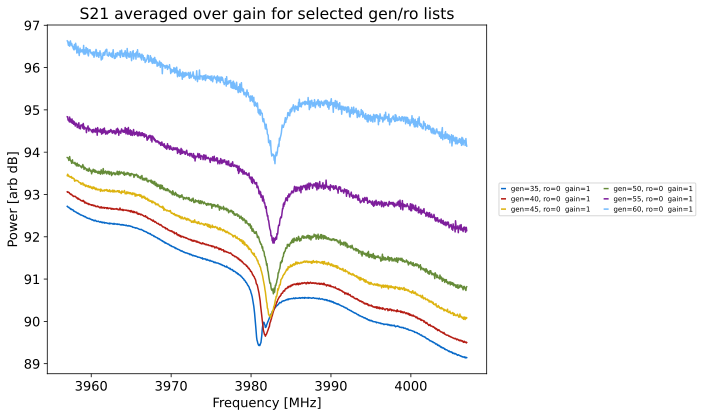

In [ ]:
gen_atten_list = np.array([35, 40, 45, 50, 55, 60])
ro_atten_list  = np.array([0])

plt.figure(figsize=(10, 6))

for gen in gen_atten_list:
    for ro in ro_atten_list:

        for (gen_atten, ro_atten, gain), d in results.items():
            if gen_atten == gen and ro_atten == ro:
                f = np.ravel(d["freq"])
                p = np.ravel(d["power"])
                # mag = 10**(p/20) 

                atten_db = float(gen_atten) + float(ro_atten)
                p_norm = p + atten_db # both are in magnitude dB???

                # atten_mag = 10**(atten_db/20) 

                # mag_norm = p_norm / np.min(p_norm) 

                plt.plot(f, p_norm, label=f"gen={gen}, ro={ro}  gain={gain}")

plt.xlabel("Frequency [MHz]")
plt.ylabel("Power [arb dB]")
plt.title("S21 averaged over gain for selected gen/ro lists")
plt.legend(fontsize=7, ncol=2, loc="center left", bbox_to_anchor=(1.02, 0.5))
plt.tight_layout()

plt.show()


In [ ]:
normalize base attenuation 


  0%|          | 0/5 [00:00<?, ?it/s]

ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing
ro_ch was defined for generator 0, but it's not multiplexed and doesn't have a mixer, so it will do nothing


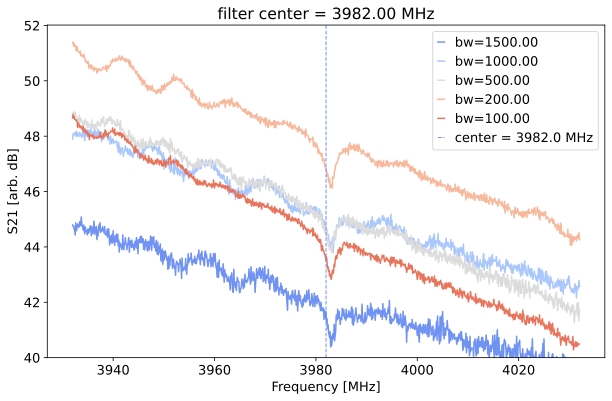

In [612]:
GEN_CH = 0
RO_CH = 10
gen_atten_1 = 5
gen_atten_2 = 15
ro_atten = 30
gain = 0.001
nyqz = 2

soc.rfb_set_gen_rf(GEN_CH, 0, 0)
soc.rfb_set_ro_rf(RO_CH, 0)
freq = 3982
d=[]
plt.figure(figsize=(10, 6)) 
for bw in tqdm([1500, 1000, 500, 200, 100]):

    soc.rfb_set_ro_filter(config['ro_ch'], fc=freq/1000, ftype='bandpass', bw=bw/1000)
    
    soc.rfb_set_gen_filter(config['gen_ch'], fc=freq/1000, ftype='bandpass', bw=bw/1000)

    f, p = measure_s21(GEN_CH, RO_CH, nyqz, gain, steps=1001,f_center_MHz=freq, span_MHz=100, progress=False)
    plt.plot(f, p, label="bw=%.2f"%(bw))
    d.append(p)
    
plt.axvline(freq, linestyle="--", linewidth=1, label=f"center = {freq:.1f} MHz")
plt.ylabel("S21 [arb. dB]")
plt.xlabel("Frequency [MHz]")
plt.ylim(bottom=40)
plt.title("filter center = %.2f MHz"%(freq))
plt.legend()
plt.show()

[array([56.46892464, 56.50002905, 56.49830929, ..., 51.80641748,
        51.68787606, 51.84436756]),
 array([59.80241472, 59.77110897, 59.78878803, ..., 54.75785247,
        54.74685152, 54.67318848]),
 array([60.29256485, 60.2957785 , 60.31674887, ..., 54.08378364,
        54.06585557, 54.04799892]),
 array([62.0263434 , 62.03627545, 62.02277671, ..., 56.57561456,
        56.59143293, 56.33216605]),
 array([59.9648599 , 59.97085929, 59.95386184, ..., 52.80889302,
        52.80670214, 52.81159314])]

In [ ]:
# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 0, 0)
soc.rfb_set_gen_rf(1, 0, 0)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(10, 0)

# 4 LPF and 4HPF, 0 is bypass
lpf_list = [0,1,2,3,4]
hpf_list = [0,1,2,3,4]
# Set band pass filters
bandwidth = np.linspace(100,1000,8) # bandwidth in MHz
d=[]

for qi in qubit_list:    
    for lpf, hpf in zip(lpf_list, hpf_list):
        d.append([])
        bw=int(bw)
        set_filter_ro(10, lpf, hpf, state=2) # ADC channel 10
        for lpf2, hpf2 in zip(lpf_list, hpf_list):        
            set_filter_gen(0, lpf2, hpf2, state=2) # DAC channel 0
            time.sleep(1)
            
            # Manually set the span and gain 
            #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':20, 'gain':1, 'reps':10000})

            # Fully automated, using previous fit to kappa to set span
            rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa'})
            d[-1].append(rspec)


In [448]:
# LPF options
np.linspace(3.35,7.25,16)

#print(np.linspace(3.4,7.25,16))
# LPF: 4.13, 4.39, 4.65 [3,4,5]
# HPF: 3.4, 3.65, 3.91 [0,1,2]

array([3.35, 3.61, 3.87, 4.13, 4.39, 4.65, 4.91, 5.17, 5.43, 5.69, 5.95,
       6.21, 6.47, 6.73, 6.99, 7.25])

In [453]:
hl_diff=[]
hl_mean=[]
LPF=[ 4.13, 4.39, 4.65]
HPF= [3.4, 3.65, 3.91]
for h in HPF:
    for l in LPF:
        hl_diff.append(l-h)
        hl_mean.append((h+l)/2)

In [462]:
print(np.round(np.array(hl_diff),4))

[0.73 0.99 1.25 0.48 0.74 1.   0.22 0.48 0.74]


In [459]:
print(np.array(hl_mean)-3.982)

[-0.217 -0.087  0.043 -0.092  0.038  0.168  0.038  0.168  0.298]


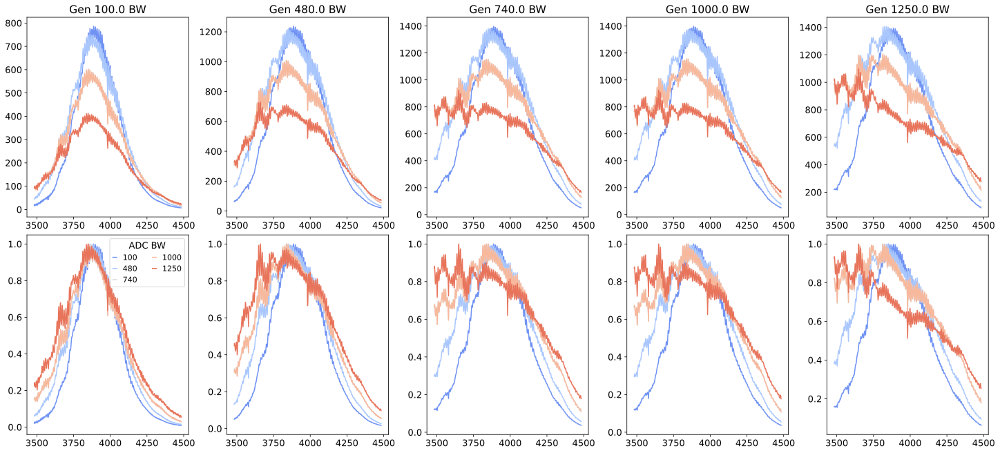

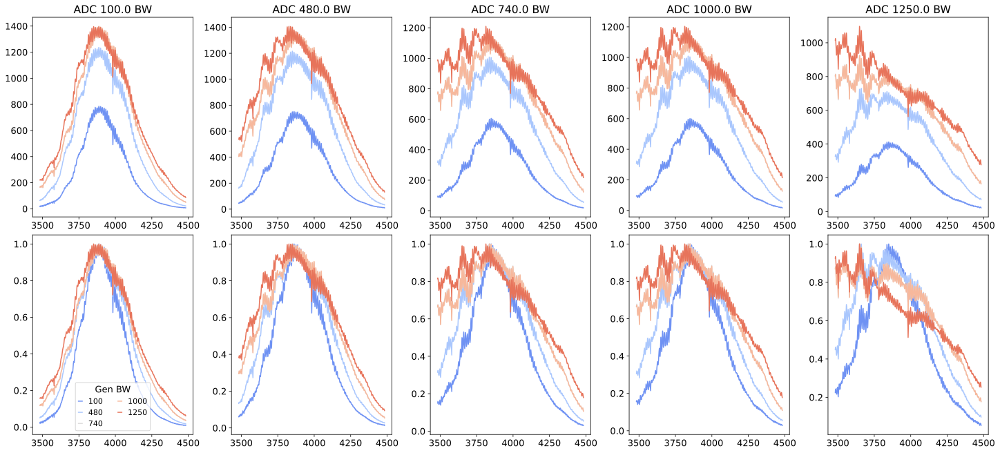

In [500]:
import seaborn as sns
sns.set_palette('coolwarm', n_colors=len(d))
fig, ax = plt.subplots(2,len(d), figsize=(20,9), layout='constrained')
for i, dr in enumerate(d):
    for j, dd in enumerate(dr):
        ax[0,j].plot(dd.data['xpts'],dd.data['amps'], label=int(bandwidth[i]))
        #ax[1,j].plot(dd.data['xpts'],dd.data['amps']/np.mean(dd.data['amps']), label=int(bandwidth[i]))
        ax[1,j].plot(dd.data['xpts'],dd.data['amps']/np.max(dd.data['amps']), label=int(bandwidth[i]))
        ax[0,j].set_title(f'Gen {bandwidth[j]} BW')
        ax[0,j].set_title(f'Gen {bandwidth[j]} BW')

ax[1,0].legend(ncols=2, fontsize=11, title='ADC BW')


fig, ax = plt.subplots(2,len(d), figsize=(20,9), layout='constrained')
for i, dr in enumerate(d):
    for j, dd in enumerate(dr):
        ax[0,i].plot(dd.data['xpts'],dd.data['amps'], label=int(bandwidth[j]))
        #ax[1,i].plot(dd.data['xpts'],dd.data['amps']/np.mean(dd.data['amps']), label=int(bandwidth[j]))
        ax[1,i].plot(dd.data['xpts'],dd.data['amps']/np.max(dd.data['amps']), label=int(bandwidth[j]))
        ax[0,i].set_title(f'ADC {bandwidth[i]} BW')

ax[1,0].legend(ncols=2, fontsize=11, title='Gen BW')

### Low gain (for purcell)

In [ ]:
update=False # Set to true if you want to update the config file with the new resonance values

# comment out one of these 
#qubit_list = np.arange(3)
qubit_list=[3]

for qi in qubit_list:    
    # Manually set the span and gain 
    #rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':1, 'gain':0.3})

    # Fully automated, using previous fit to kappa to set span
    rspec = meas.ResSpec(cfg_dict, qi=qi, params={'span':'kappa', 'gain':0.01, 'reps':600})
    auto_cfg = config.update_config(cfg_path[0:-4]+'_model.yml' , None,'kappa_low', float(rspec.data['kappa']), qi)

### Print out scan params

In [115]:
rspec.data['kappa']

0.38279751301178594

## Resonator Power Spectroscopy 

Find a good value for gain to park your readout at until you run readout optimization. From the 2D sweep that is produced, choose a value for gain that is right before the resonator punches out. Want to choose a high value for gain because we want to be in the shot noise limited regime which increases our signal:noise ratio. 

In [122]:
1/0.001

1000.0

  0%|          | 0/100 [00:00<?, ?it/s]

Attempted to init fitparam 0 to 4006.7868764877317, which is out of bounds 3956.790000915527 to 4006.7868764877317. Instead init to 3981.7884387016293
Attempted to init fitparam 0 to 4006.7868764877317, which is out of bounds 3956.790000915527 to 4006.7868764877317. Instead init to 3981.7884387016293
High power peak [MHz]: 3978.8446
Low power peak [MHz]: 3983.0187
Lamb shift [MHz]: -4.1741


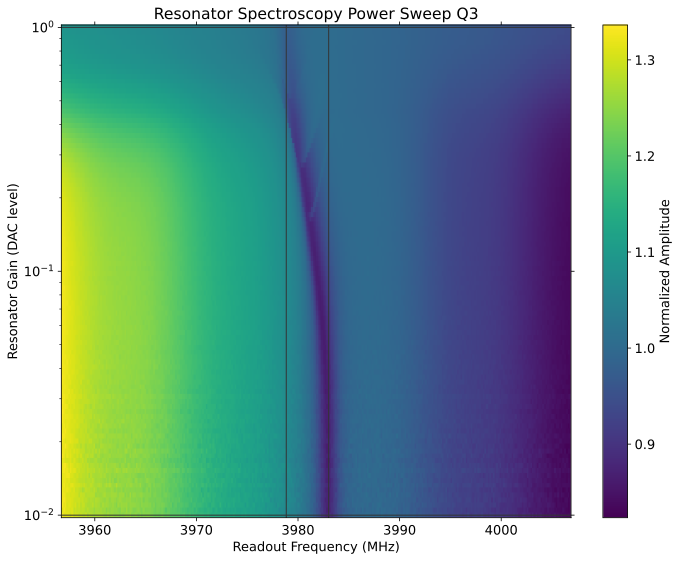

In [44]:
update=True

# qubit_list = np.arange(3)
qubit_list=[3]

# Set attenuator on DAC.
soc.rfb_set_gen_rf(0, 5, 15)
soc.rfb_set_gen_rf(1, 0, 0)
# Set attenuator on ADC.
soc.rfb_set_ro_rf(0, 30)

d=[]
for qi in qubit_list:
    #rpowspec=meas.ResSpecPower(cfg_dict, qi=qi)
    params={'rng':100,'max_gain': 1, "start_gain": 1, 'span':50,"f_off":1,'expts_gain':100}
    rpowspec=meas.ResSpecPower(cfg_dict, qi=qi, params=params)#, live_plot=True)
    d.append(rpowspec)
    if update:
        auto_cfg = config.update_readout(cfg_path, 'lamb', rpowspec.data['lamb_shift'], qi)

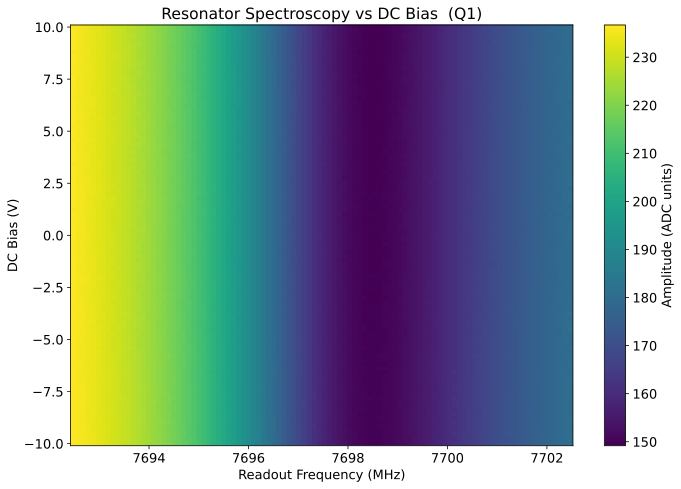

0.0

In [351]:
qubit_list = [1]

soc.rfb_set_bias(0,0.0)
params = {
    # inner 1D settings
    "span": 10, "expts": 100, "reps": 1000, "gain": 0.4,
    # outer DC sweep settings
    "dc_start": -10, "dc_stop": 10, "expts_dc": 101,
    "bias_chan": 0,         
    "dc_settle": 0.02,
    "dc_verify_print": False 
}
for qi in qubit_list: 
    res_exp_2 = meas.ResSpecFlux(cfg_dict, qi=qi, params=params, go=True, display=True)

soc.rfb_set_bias(0,0.0)

In [347]:
soc.rfb_set_bias(0,0.0)

0.0

In [217]:
import numpy as np, pandas as pd
bias_V = np.asarray(res_exp.data["ypts"])        # DC bias axis (V)
f0_MHz = np.asarray(res_exp.data["f0"])          # fitted resonator freq (MHz)

df = pd.DataFrame({"bias_V": bias_V, "f0_MHz": f0_MHz})
print(df)

     bias_V       f0_MHz
0     -1.00  7537.020283
1     -0.98  7537.098614
2     -0.96  7537.209396
3     -0.94  7537.326471
4     -0.92  7537.431243
..      ...          ...
96     0.92  7537.633370
97     0.94  7537.543156
98     0.96  7537.441366
99     0.98  7537.357657
100    1.00  7537.258101

[101 rows x 2 columns]


In [121]:
print("read bias:", soc.rfb_get_bias(0))
print("set bias:", soc.rfb_set_bias(0,0.0))
print("read bias:", soc.rfb_get_bias(0))

read bias: 0.0
set bias: 0.0
read bias: 0.0


### Example of plotting 2D scans for a bunch of qubits together
Can also use for varying a parameter on one qubit and plotting the results together

In [ ]:
auto_cfg = config.load(cfg_path)
horz_line = auto_cfg.device.readout.gain
handy.plot_many(d, title='Resonator Power', save_path=cfg_dict['expt_path'], chan='amps', yax='log', norm=True, horz_line=horz_line)

### Save gain values 

In [ ]:
# assign the resonator gain to the results config file
gain_values = [0.1,0.01]
for i, qi in enumerate(qubit_list):
    auto_cfg = config.update_readout(cfg_file, 'gain', gain_values[i], qi)

# Qubit Spectroscopy

## Find qubits
More automated, zooms out and adds power if no peak visible. Best to use if you're feeling confident, otherwise use more manual stuff in next cell. 

In [ ]:
# qubit_list = np.arange(3)
qubit_list= [1]

bad_qubits=[]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='fine')
    if not status:
        bad_qubits.append(qi)

## General search, specify width 

style options: fine, medium, coarse, huge (will change scan width and power)

Uses config values of low_gain (gain to use for finest scan), which sets overall gain for device and spec_gain (set indepedently for each qubit) to decide how much power to apply

You may also just want to do this fully manually by specifiying params. 

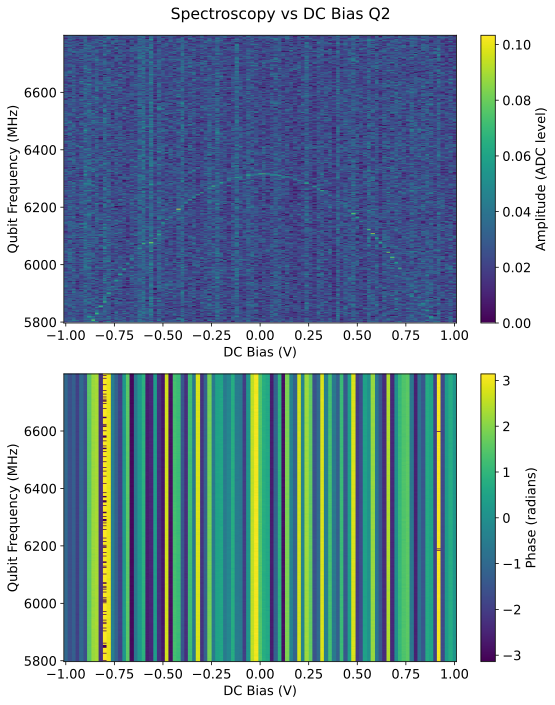

In [218]:
qubit_list = [2]

params = {
    # inner 1D settings
    "span": 1000, "expts": 500, "reps": 1000, "gain": 0.005,
    # outer DC sweep settings
    "dc_start": -1.0, "dc_stop": 1.0, "expts_dc": 101,
    "bias_chan": 0,         
    "dc_settle": 0.02, 
    "dc_verify_print": False, # toggle to True if you want readback per row
    "bias_table_V": df["bias_V"].to_numpy(),
    "f0_table_MHz": df["f0_MHz"].to_numpy()
}
for qi in qubit_list: 
    exp = meas.QubitSpecFlux(cfg_dict, qi=qi, params=params, go=True, display=True)
    # data is in exp.data; plot saved via exp.display()


In [158]:
print("read bias:", soc.rfb_get_bias(0))
print("set bias:", soc.rfb_set_bias(0,0))
print("read bias:", soc.rfb_get_bias(0))

read bias: 0.0
set bias: 0.0
read bias: 0.0


In [89]:
freq = 2200 #3273.59 # center frequency in MHz
bw = 2000 # bandwidth in MHz

# Set band pass filters
soc.rfb_set_gen_filter(1, fc=freq/1000, ftype='lowpass', bw=bw/1000) # DAC channel 1

In [91]:
soc.rfb_set_gen_filter(1, fc=0, ftype='bypass')


In [175]:
soc.rfb_set_gen_rf(1, 5, 15)

(5.0, 15.0)

  0%|          | 0/200000 [00:00<?, ?it/s]

R2:0.591	Fit par error:0.051	 Best fit:b'avgi'


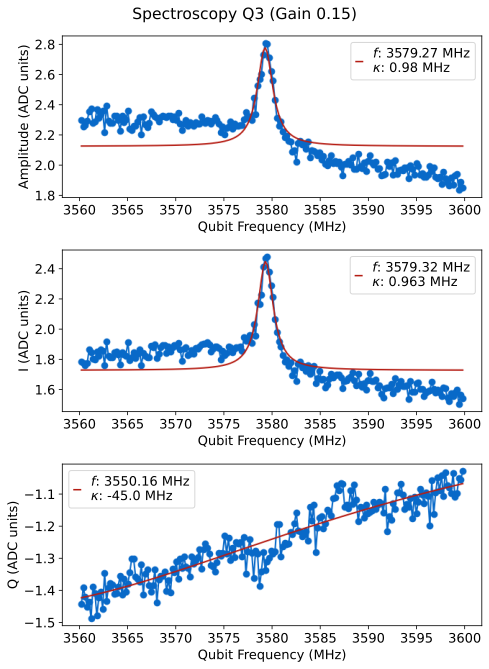

In [203]:
update=False

qubit_list = [3]
for qi in qubit_list: 
    # Default params, just specify style 
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium',params={'start':3560,"span": 40, "reps": 1000,"gain": 0.15,  'sep_readout':False})

    # Different examples of params you might give; frequency can be specified as start and span or if no start given, center is f_ge from config
    # qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'span':500})
    #params={'start':3825, 'span':100, 'gain':0.04, 'expts':200}
    #params={'span':50,'expts':200,'gain':0.06,'sep_readout':True, 'length':3, 'readout_length':10, 'reps':10000}
    # params={'span':30,'expts':200,'gain':0.08,}

    # qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params=params)
    if update and qspec.status: 
        auto_cfg = config.update_qubit(cfg_path, 'f_ge', qspec.data["best_fit"][2], qi)
        auto_cfg = config.update_qubit(cfg_path, 'kappa',2*qspec.data["best_fit"][3], qi)
    elif update:
        print(f'Bad qubit! qi={qi}')

## Stark (still getting it working)

In [ ]:
qi=0
params={'df_stark':0, 'max_stark_gain':0.2, 'df':-55,'span':130, 'stark_expts':50,'stark_rng':50}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

In [ ]:
qi=0
params={'df_stark':0, 'max_stark_gain':0.1, 'df':-30,'span':130, 'stark_expts':50,'stark_rng':50}
stark_spec=meas.StarkSpec(cfg_dict, qi=qi, style='medium', params=params)

this returns term $k g^2$, which we can then use to calculate the number of photons in the resonator during readout, as well as frequency offset during readout. 

In [ ]:
auto_cfg_model = config.load(cfg_file_path[:-4] + '_model.yml')
auto_cfg= config.load(cfg_file_path)

k = stark_spec.data['ng2']/auto_cfg_model['g_chi'][qi]
nphotons = auto_cfg['device']['readout']['gain'][qi]**2*k

## Power sweep

In [39]:
print("read bias:", soc.rfb_get_bias(0))
print("set bias:", soc.rfb_set_bias(0,0))
print("read bias:", soc.rfb_get_bias(0))

read bias: 0.0
set bias: 0.0
read bias: 0.0


In [81]:
soc.rfb_set_gen_filter(1, fc=0, ftype='bypass')

In [156]:
freq = 9700 #3273.59 # center frequency in MHz
bw = 1000 # bandwidth in MHz

# Set band pass filters
soc.rfb_set_gen_filter(1, fc=freq/1000, ftype='bandpass', bw=bw/1000) # DAC channel 1

In [ ]:
qspec_pow.data

## Qubit power sweep

In [77]:
0.01/100

0.0001

  0%|          | 0/30 [00:00<?, ?it/s]

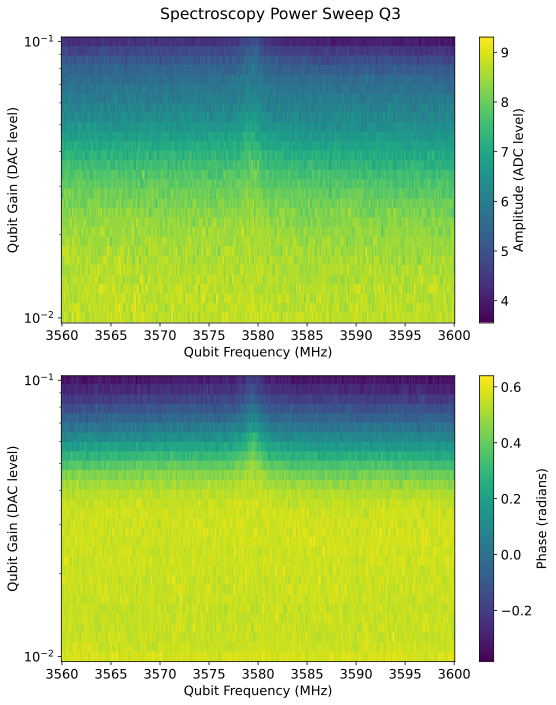

In [206]:
qubit_list=[3]

d = []
for qi in qubit_list:
    params={'start':3560,'span':40,'expts':300, 'max_gain':0.1, 'rng':10,"expts_gain": 30, 'sep_readout':False}
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
    d.append(qspec_pow)
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params={'start':3700,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True})
# handy.plot_many(d, title='Qubit Power')

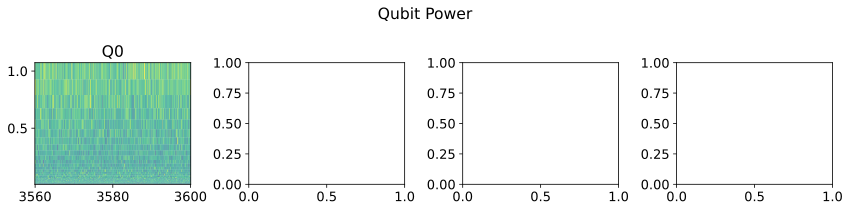

In [188]:
handy.plot_many(d, title='Qubit Power')

### Sweep pulse length 
Useful when t1 low

sep_readout = False measures at same time as probe pulse (default is True)

In [ ]:
length = [1,3,5,10]
for l in length:
    for qi in qubit_list:
        params={'start':3000,'span':600,'reps':1500,'expts':1200, 'max_gain':0.4, 'length':1,'sep_readout':True}
        params={'start':4000,'span':200,'expts':300,'length':l}
        qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)
        #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='', params=params)

### Narrow scan

In [ ]:
qq=[]

# qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='narrow')#, live_plot=True)
    
    # Nice for pretty pics once you have T1 measurement. 
    #qspec_pow = meas.QubitSpecPower(cfg_dict, qi=qi, style='fine', params={'length':'t1','max_gain':1})
    qq.append(qspec_pow)

# When measuring many qubits, can do a bunch of color plots this way
#handy.plot_many(qq, title='Qubit Power Amps 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='amps')
#handy.plot_many(qq, title='Qubit Power Phase 0.6-0.2', save_path=cfg_dict['expt_path'], yax='log', chan='phases')

### Multiple wide scans looking for qubit

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]

span = 250
start_all = [2000, 3100, 3400]
end_all = [4780, 3700, 4250]
sensitivities = [0.8, 0.4, 0.2]

d = []
for qi in tqdm(qubit_list, desc='Qubit Number'):
    starts = np.arange(start_all[qi], end_all[qi], span)
    qresults = []
    for start in tqdm(starts, desc=f'Start Frequency Sweep'):
        q_res = meas.QubitSpecPower(
            cfg_dict, 
            qi=qi, 
            style='coarse', 
            params={
                'max_gain':0.8,
                'start':start,
                'span':span,
                'rng':100,
                'reps':800}
        )#,'start':3000,'span':300'})
        qresults.append(q_res)
    
    # Handy plot
    handy.plot_many_limited(
        qresults, 
        title=f'Qubit Power for qubit {qi}', 
        save_path=cfg_dict['expt_path'],
        yax='log', 
        chan='amps', 
        individial_fig_size= (6,6), 
        xlabel='Frequency (MHz)',
        sensitivity =  sensitivities[qi],
        save = False,
    )
    d.append(q_res)
    plt.show()

# Coherent scans

## Fast tuneup

Options are: 

first_time: assume we don't know t1 time,don't have single shot working

single: do single shot readout optimization 

readout: set readout frequency based on resonator fit

In [ ]:
# qubit_list = np.arange(3)
qubit_list=[0]


#qubit_list=np.delete(qubit_list, [5,13])
# Worst issue with this right now is when the qubit frequency is not correct and readout is bad;
# gets stuck doing ramsey/spectroscopy forever. In this case, cancel it and go back to find qubits, 
# try changing readout gain. 
plt.rcParams.update({'font.size': 11})
for qi in qubit_list: 
    qubit_tuning.tune_up_qubit(qi, cfg_dict, first_time=False, single=False, readout=True)

## Time tracking
fast = True only measures T2 and T1, otherwise does full set of scans.

In [ ]:
scan_length = 18 #  hours 

qubit_list = [0,1, 2]
tt, csv_pth, tt_stats = time_tracking(qubit_list, cfg_dict,display=False,total_time=scan_length, fast=True)

In [ ]:
from slab_qick_calib.analysis import allan 

allan.perform_analysis(np.array(tt[0]['time']), np.array(tt[0]['t1']),'hi')

In [ ]:
qubit_params.stats(cfg_path, tt_stats, qubit_list)

## Rabi

### Amplitude

Uses gain/sigma set in pulses part of config

Unexpected parameters found in params: {'sigma'}


  0%|          | 0/15000 [00:00<?, ?it/s]

R2:-0.134	Fit par error:0.563	 Best fit:b'amps'


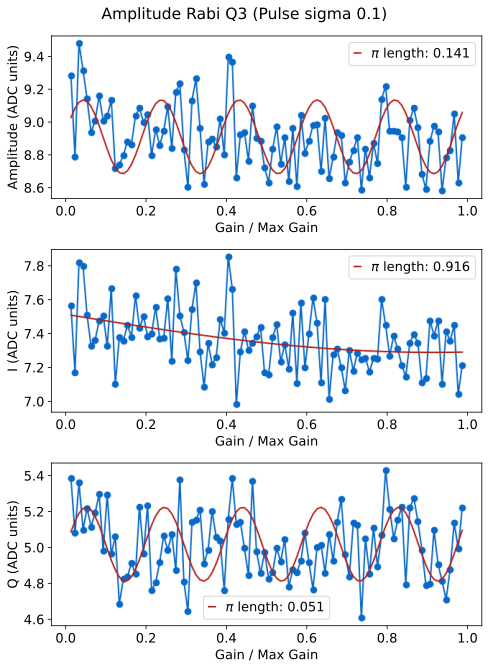

In [157]:
# qubit_list = np.arange(3)
qubit_list=[3]

update=False

for qi in qubit_list: 
    #amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi)#, disp_kwargs={'show_hist':True})
    
    # Fully customized version
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'expts':100, "sigma":0.1,'max_gain':1})#, disp_kwargs={'show_hist':True})

    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['pi_length'], qi)
        

### Many pi pulses rabi

  0%|          | 0/120000 [00:00<?, ?it/s]

R2:0.182	Fit par error:0.987	 Best fit:b'avgi'


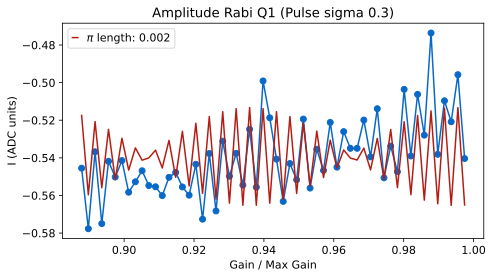

In [413]:
qi=1
update=False

amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'n_pulses':15})
if update and amp_rabi.status:
    ind = np.argmax(amp_rabi.fitfunc(amp_rabi.data['xpts'], *amp_rabi.data['best_fit']))
    config.update_qubit(cfg_path, ('pulses','pi_ge','gain'), amp_rabi.data['xpts'][ind], qi);

#### Amp Chevron

  0%|          | 0/30 [00:00<?, ?it/s]

 C:\_Lib\python\qq\slab_qick_calib\experiments\single_qubit\rabi.py: 739

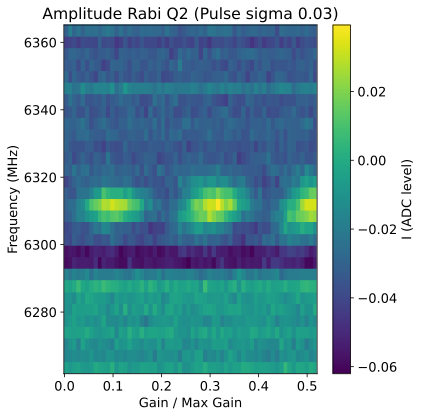

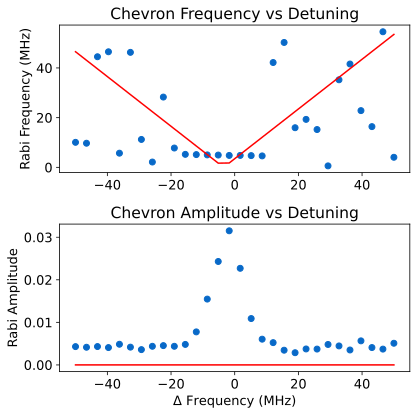

In [259]:
d2=[]
#qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list: 
    amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':100})#, params={'span_f':150,'sigma':0.25,'expts_f':100,'expts':100})

    #amp_rabi_chevron = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'span_f':10, 'expts_f':20, 'checkEF':True})#, live_plot=True)
    d2.append(amp_rabi_chevron)

#handy.plot_many(d2, title='Rabi Chevron Phase', save_path=cfg_dict['expt_path'], chan='phases')

In [ ]:
handy.plot_many(d2, title='Rabi Chevron', save_path=cfg_dict['expt_path'])

In [ ]:
amp_rabi_chevron.display(plot_both=True)

### Length -- Uses const pulses so do not use to set up pi pulses

Cannot do fast sweep with gaussian pulses due to multiplying qickparams issues; so need the "loop:True" for those, will make everything slower. 

  0%|          | 0/120000 [00:00<?, ?it/s]

R2:0.682	Fit par error:0.072	 Best fit:b'avgi'


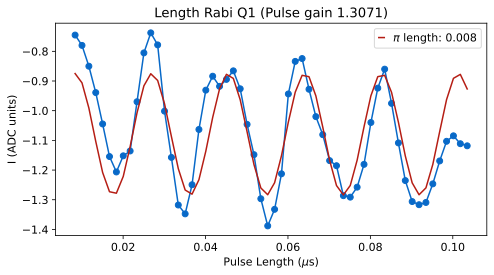

In [460]:
qubit_list = [1]
for qi in qubit_list: 
    # Needs to have params of sweep: length and type: cons
    #len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'gauss','loop':True})
    len_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'sweep':'length', 'pulse_type':'const', 'max_length':0.2})

#### Length Chevron

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
for qi in qubit_list: 
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const"})
    len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"pulse_type":"const", 'length':0.2205, 'expts_f':40})
    #len_rabi = meas.RabiChevronExperiment(cfg_dict,qi=qi, params={'sweep':'length',"type":"const", 'sigma':0.205, 'expts_f':60, 'span_f':150, 'gain':0.4,'start_f':6280,'rounds':4})

## Ramsey

  0%|          | 0/90000 [00:00<?, ?it/s]

R2:0.066	Fit par error:0.453	 Best fit:b'avgi'
R2:0.015	Fit par error:0.453	 Best fit:b'avgi'


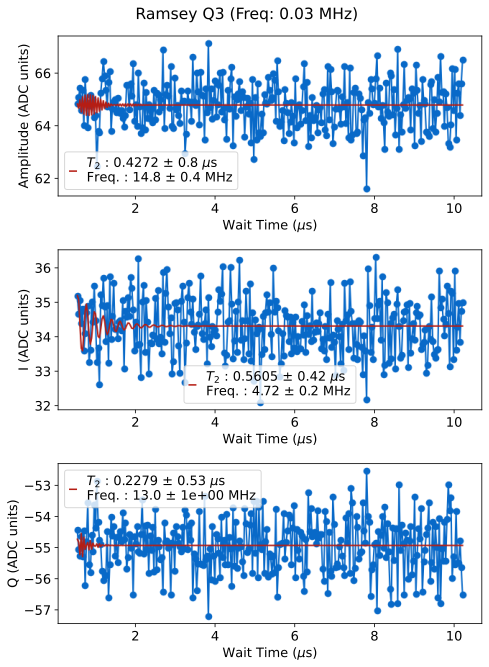

T2 Ramsey fit failed


In [358]:
qubit_list=[3]
update = False

for qi in qubit_list:
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10)

    # Manually configured
    t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'expts':300, 'span':10,'start':0.01})#, disp_kwargs={'show_hist':True})
    #t2r = meas.T2Experiment(cfg_dict, qi=qi, max_err=10, params = {'ramsey_freq':1,'expts':100, 'span':10,'start':0.01})
    if t2r.status and update:
        config.update_qubit(cfg_path, 'f_ge', t2r.data['new_freq'], qi)
        auto_cfg = config.update_qubit(cfg_path, 'T2r', t2r.data['best_fit'][3], qi, rng_vals=[1.5, max_t1], sig=2)
    else:
        print('T2 Ramsey fit failed')

### Use Ramsey to recenter

In [ ]:
qubit_list = [0]
for qi in qubit_list:
    status = qubit_tuning.recenter(qi,cfg_dict)            

### Ramsey coherence

In [ ]:
t1= qubit_tuning.get_coherence(meas.RamseyExperiment, qi, cfg_dict,par='T2r')

## T1

If it's the first time, also set T2r and T2e as guesses 


  0%|          | 0/60000 [00:00<?, ?it/s]

R2:0.034	Fit par error:5443.414	 Best fit:b'amps'


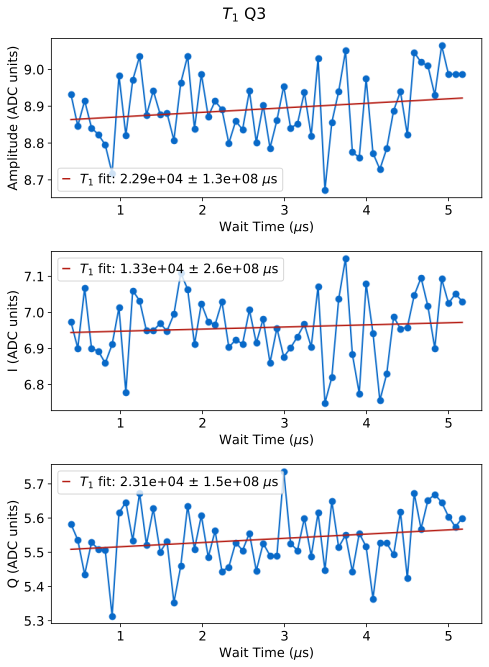

In [235]:
update=False
first_time=True

# qubit_list = np.arange(3)
qubit_list=[3]
for qi in qubit_list:
    #t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'expts':5})
    t1 = meas.T1Experiment(cfg_dict, qi=qi, params={'reps':1000,'span':5, 'start':0})
    #t1 = meas.T1Experiment(cfg_dict, qi=qi, disp_kwargs={'show_hist':True})

    if update: t1.update(first_time=first_time)

### T1 coherence

Runs scan until scan is properly configured to be sensitive to T1

In [ ]:
qi=0
qubit_tuning.get_coherence(meas.T1Experiment,qi=qi,cfg_dict=cfg_dict,par='T1')

### Continuous scan at single point
Times do not seem to be accurate right now 

In [ ]:
qi=0
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':120000})

In [ ]:
t1cont.display(filter_type='boxcar')

In [ ]:
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})
t1cont = meas.T1ContExperiment(cfg_dict,qi=qi, params={'shots':8000000})

In [ ]:
float(t1cont.data['times'][2]-t1cont.data['times'][1])/10

In [ ]:
len(t1cont.data['t1_estimates'])
t1_data = t1cont.data['t1_estimates']

from slab_qick_calib.analysis import time_series
sampling_rate = 1/ float(t1cont.data['times'][2]-t1cont.data['times'][1])
print(f'Sampling rate is {sampling_rate} Hz')
nperseg = min(2048, int(2 ** np.floor(np.log2(len(t1_data) / 4))))

time_series.analyze_qubit_psd(
    t1_data, fs=sampling_rate, nperseg=nperseg
)

plt.figure()
plt.plot(t1cont.data['times'], t1cont.data['t1_estimates'], '.-')

In [ ]:
from slab_qick_calib.analysis import allan 

allan.perform_analysis(t1cont.data['times'], t1cont.data['t1_estimates'],'hi')

In [ ]:

nan_inds = np.where(np.isnan(t1cont.data['t1_estimates']))[0]

times = np.delete(t1cont.data['times'], nan_inds)
t1_data = np.delete(t1cont.data['t1_estimates'], nan_inds)

In [ ]:
allan.perform_analysis(times, t1_data,'hi')

In [ ]:
float(t1cont.data['times'][2]-t1cont.data['times'][1])

### T1 continuous 2Q

In [ ]:
qi = [10,0]
meas.T1_2Q(cfg_dict,qi=qi, )

In [ ]:
qi=[0,10]
scan_time = 0.1 #hours
number_of_scans = 1
shots = int(100000*scan_time*60/4)
print(shots)
for i in range(number_of_scans):
    meas.T1Cont2QExperiment(cfg_dict,qi=qi, params={'shots':shots, 'active_reset':False})

## Echo and more

  0%|          | 0/1042000 [00:00<?, ?it/s]

R2:0.934	Fit par error:0.037	 Best fit:b'avgi'


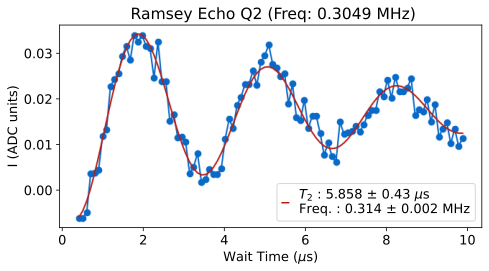

*Set cfg device.qubit 2 T2e to 5.86 from 4.92*


In [247]:
qubit_list = np.arange(3)
qubit_list=[2]
update=True
for qi in qubit_list:
    # Need to have experiment type set to echo
    t2e = meas.T2Experiment(cfg_dict, qi=qi, params={'experiment_type':'echo', 'span':10, 'expts':100})
    if t2e.status and update:
        auto_cfg = config.update_qubit(cfg_path, 'T2e', t2e.data['best_fit'][3], qi,sig=2, rng_vals=[1.5, max_t1*2])

### More pi / CPMG
Breaks above 12 right now; need to make it a python loop 

In [ ]:
qubit_list = np.arange(3)
qubit_list=[2]
update=True
nums_pi = [1,2,3,5,8,12]
t2_list = []
for qi in qubit_list:
    for pi in nums_pi:
        # Need to have experiment type set to echo
        #params=params={'experiment_type':'cpmg','num_pi':pi, 'span':400, 'ramsey_freq':0.02, 'reps':500}
        params=params={'experiment_type':'cpmg','num_pi':pi,}
        if pi>1:
            params['span']= t2e.data['fit_avgi'][3]*3.5
            params['ramsey_freq']=1.5/t2e.data['fit_avgi'][3]


        t2e = meas.T2Experiment(cfg_dict, qi=qi, params=params)
        t2_list.append(t2e.data['best_fit'][3])


In [ ]:
plt.figure()
plt.plot(1/np.array(nums_pi), t2_list, 'o-')
plt.xlabel('1/Number of pi pulses')

### Get echo coherence

In [ ]:
qi=6
t2e = qubit_tuning.get_coherence(meas.RamseyEchoExperiment, qi, cfg_dict,'T2e')

## Feedback checks

In [ ]:
qi=0
# This makes sure that waits are set correctly for active reset so that you get the same value from the buffer as ... 
reset = meas.MemoryExperiment(cfg_dict, qi=qi, params={'shots':1, 'expts':10})

In [ ]:
# Don't do the active reset, just do the repeated measurement 
qi=1
shot = meas.RepMeasExperiment(cfg_dict, qi=qi, params={'shots':10000,'active_reset':False, 'setup_reset':False})
shot.check_reset()

In [ ]:

np.mean(shot.data['Ig'])
np.mean(shot.data['Ie'])

# Single Shot

In [ ]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[2]

for qi in qubit_list:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi)

    # Configure number of shots
    #shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000})
    shot.update()

  0%|          | 0/10000 [00:00<?, ?it/s]

  0%|          | 0/10000 [00:00<?, ?it/s]

### Adjust reps for fidelity 

In [165]:
max_inc = 15 # dont' let it do more than 15x standard number of reps so that things don't take forever
qubit_list = [2]

auto_cfg = config.load(cfg_path)
for qi in qubit_list:
    config.update_readout(cfg_path, 'reps', 1/auto_cfg['device']['readout']['fidelity'][qi]**1.5, qi, rng_vals=[1,max_inc]);

*Set cfg device.readout 2 reps to 10.4211 from 1*


## Readout opt

### General sweep

Runs single shot experiments for many readout lengths, frequencies, gains and compares fidelity

low_gain=True chooses lowest gain/readout length within a few percent of maximum gain (often readout fidelity fairly flat as a function of gain at higher gain values) 

style='fine' varies parameters by 20%, style='' varies by 2x

In [ ]:
update=True
low_gain=True

qubit_list=np.arange(3)
qubit_list=[0]

#params = {'expts_f':1, 'expts_gain':5, 'expts_len':5,'shots':10000}
params = {'expts_f':1, 'expts_gain':5, 'expts_len':5}

# Specify exact ranges to use  
#params = {'expts_f':1, 'expts_gain':9, 'expts_len':9,'start_gain':0.45, 'span_gain':0.05,'start_len':2, 'span_len':5}

for qi in qubit_list: 
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params=params, style='fine')
    shotopt.analyze(low_gain=low_gain)
    if update: shotopt.update(cfg_dict['cfg_file'])

    shot=meas.HistogramExperiment(cfg_dict, qi=qi)
    shot.update()

### Run optimization until it converges

In [ ]:
qubit_list=np.arange(3)
qubit_list=[0]
params = {'expts_f':1, 'expts_gain':5, 'expts_len':5}

# do_res also runs res spec and resets readout frequency that way each round. 
qubit_tuning.meas_opt(cfg_dict, qubit_list, params, do_res=True)

### Vary trig_offset to see if it changes fidelity. 

In [ ]:
# Single shot 
qubit_list = np.arange(3)
qubit_list =[0]
trig_list = np.linspace(0.2,0.6,12)
fids =[]
for qi in qubit_list:
    for trig in trig_list: 
        config.update_readout(cfg_path, 'trig_offset', trig, qi);
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'trigger':trig}, progress=False, display=False)
        fids.append(float(shot.data['fids'][0]))
    

### Play with LO freq (when using qick for LO)

In [ ]:
auto_cfg = config.load(cfg_path)
start_freq = auto_cfg.device.readout.frequency[qi]
start_mixer = auto_cfg.hw.soc.lo.mixer_freq[qi]
rng = np.linspace(-1000,1000,11)
fids=[]
for qi in qubit_list: 
    for r in rng: 
        config.update_lo(cfg_path, 'mixer_freq', start_mixer+r, qi)
        config.update_readout(cfg_path, 'frequency', start_freq-r, qi)
        shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000})
        fids.append(shot.data['fids'][0])

config.update_lo(cfg_path, 'mixer_freq', start_mixer, qi)
config.update_readout(cfg_path, 'frequency', start_freq, qi)

#### Play with LO power

In [ ]:
qi = 0
gain_vals = [0.0375,0.05] 
fids = []
for gain in gain_vals:
    config.update_lo(cfg_path, 'gain', gain, qi)
    shotopt=meas.SingleShotOptExperiment(cfg_dict, qi=qi,params={'npts_f':5, 'npts_gain':5, 'npts_len':5})
    fids.append(shot.data['fids'][0])

# Active reset

### Check active reset at standard threshold

Setup reset uses the calibrated angle and runs active reset process at end, but also uses usual final_delay so that it's ok if reset not working

In [ ]:
qubit_list = np.arange(3)
qubit_list=[1]
d=[]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'active_reset':True, 'setup_reset':True})
    shot.check_reset()
    #config.update_readout(cfg_path, 'reset_e', shot.data['reset_e'], qi)
    #config.update_readout(cfg_path, 'reset_g', shot.data['reset_g'], qi)
    d.append(shot)

## Don't do reset, but measure repeatedly 

In [ ]:
qi=1
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'remeas':True, 'shots':40000})
shot.check_reset()

## Plot fidelity vs v threshold for active reset

In [ ]:
qi=1
rng=6
npts = 31
fids = []

auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,npts)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000,'threshold_v':t, 'active_reset':True,'setup_reset':False, 'reset':3}, display=False, progress=False)
    fids.append(float(shot.data['fids'][0]))
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')

from pathlib import Path

fig = plt.figure()
plt.plot(thresh, fids, 'o-')
plt.xlabel('Threshold (mV)')
plt.ylabel('Fidelity')
plt.axvline(threshold, color='r', linestyle='--', label=f'Threshold = {threshold:.2f}')
plt.legend()
file_path = Path(shot.fname)
new_filename = file_path.name.rsplit(".", 1)[0] + "_fidelity_reset.png"
fig.savefig(file_path.parent / "images" / new_filename)

##  Single shot experiment using active reset

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':10000, 'active_reset':True,'setup_reset':True,'reset':1})


## Test single shot

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False})


In [ ]:
fidelity=[]
final=[1, 3, 5, 7, 10]


qi=0
for f in final:
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':20000, 'active_reset':True,'final_delay':f, 'reset':1}, display=False)   

    fidelity.append(shot.data['fids'][0])

In [ ]:
fidelity


In [ ]:
fidelity


In [ ]:
qi=2
amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':True})
amp_rabi2 = meas.RabiExperiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgi'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgi'])

plt.figure()
plt.plot(amp_rabi.data['xpts'], amp_rabi.data['avgq'])
plt.plot(amp_rabi2.data['xpts'], amp_rabi2.data['avgq'])


In [ ]:
t1 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':True})
#t12 = meas.T1Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t1.data['xpts'], t1.data['avgi'], label='Active Reset')
plt.plot(t12.data['xpts'], t12.data['avgi'])
plt.legend()
# plt.figure()
# plt.plot(t1.data['xpts'], t1.data['avgq'])
# plt.plot(t12.data['xpts'], t12.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})
#t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'], label='Active Reset')
plt.plot(t22.data['xpts'], t22.data['avgi'])
plt.legend()
# plt.figure()
# plt.plot(t2.data['xpts'], t2.data['avgq'])
# plt.plot(t22.data['xpts'], t22.data['avgq'])

# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True, 'experiment_type':'echo'})
t22 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':False, 'experiment_type':'echo'})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'])
plt.plot(t22.data['xpts'], t22.data['avgi'])

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgq'])
plt.plot(t22.data['xpts'], t22.data['avgq'])

In [ ]:
t2 = meas.T2Experiment(cfg_dict,qi=qi, params={'active_reset':True})

plt.figure()
plt.plot(t2.data['xpts'], t2.data['avgi'], label='active reset')
plt.plot(t22.data['xpts'], t22.data['avgi'], label='Normal')
plt.legend()
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(t2.data['bin_centers'], t2.data['hist'])

# change the hist to take the first measurement 
plt.plot(t22.data['bin_centers'], t22.data['hist'])

In [ ]:
# histograms are different for active reset vs no active reset!!! because it's getting the full set of measured data. you should adjust to the first one. 
plt.figure()
plt.plot(amp_rabi.data['bin_centers'], amp_rabi.data['hist'])
plt.plot(amp_rabi2.data['bin_centers'], amp_rabi2.data['hist'])

## Sweep threshold

In [ ]:
d = []
qi=0
rng=25
auto_cfg = config.load(cfg_path)
threshold = auto_cfg['device']['readout']['threshold'][qi]
thresh = np.linspace(threshold-rng,threshold+rng,16)
for i, t in enumerate(thresh):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':10000,'threshold_v':t, 'active_reset':True,'setup_reset':True}, display=False, progress=False)
    d.append(shot)
    if i%4==0:
        print(f'Completed {i}/{len(thresh)}')
    #shot.check_reset()
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

In [ ]:
import slab_qick_calib
slab_qick_calib.calib.readout_helpers.plot_reset(d)

## Turn off active reset for all config chans

In [ ]:
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',False, qi)

## Turn on active reset for channels where it seems to be working

In [ ]:
e_success = 0.15 # Ratio of e proportion after active reset compared to before
g_vs_e = 2 # Ratio of g proportion to e proportion after active reset

auto_cfg = config.load(cfg_path)
reset_e = auto_cfg['device']['readout']['reset_e']
reset_g = auto_cfg['device']['readout']['reset_g']
result = np.array(reset_e)< e_success | np.array(reset_g)/np.array(reset_e)<g_vs_e
for qi in range(20):
    config.update_readout(cfg_path, 'active_reset',bool(result[qi]), qi)

## Check reset (plotting result of reset)

In [ ]:
qubit_list = np.arange(3)
qubit_list =[0]
for qi in qubit_list:
    shot = meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':50000,'active_reset':True})
    shot.check_reset()

# Chi

  0%|          | 0/5 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

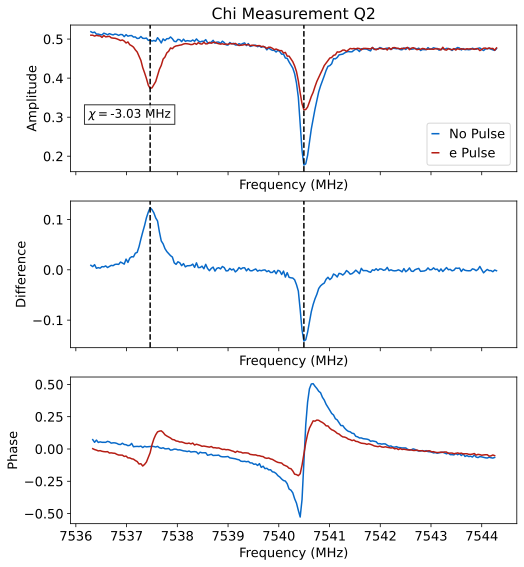

*Set cfg device.readout 2 chi to -3.0302 from 0.9492*


In [248]:
# Need a tuned up pi pulse for this
span = 8
qubit_list = [2]
for qi in qubit_list: 
    #chi, chi_val=measure_func.check_chi(cfg_dict, qi)
    chi, chi_val=measure_func.check_chi(cfg_dict, qi, span=span)
    auto_cfg = config.update_readout(cfg_path, 'chi', chi_val, qi)

# 2 Qubit

In [ ]:
t12q = meas.T1_2Q(cfg_dict, qi=[10,0], params={'active_reset':False, })

In [ ]:
rabi2q = meas.Rabi_2Q(cfg_dict, qi=[10,0], params={'active_reset':True})

# EF 

### Initial setting of frequencies based on guess for alpha

In [260]:
# Initial set of the frequencyies based on guess for alpha 
alpha = -200
#qubit_list = np.arange(3)
qubit_list = [2]
auto_cfg = config.load(cfg_path)
for i in qubit_list: 
    f_ge = auto_cfg['device']['qubit']['f_ge'][i]
    auto_cfg = config.update_qubit(cfg_path, 'f_ef', f_ge+alpha, i)

*Set cfg device.qubit 2 f_ef to 6113.4254 from 6310.1462*


## Spectroscopy EF

### General search

In [ ]:
qubit_list= np.arange(3)
bad_qubits=[]
qubit_list=[2]
for qi in qubit_list:
    status, ntries = qubit_tuning.find_spec(qi, cfg_dict, start='medium', freq='ef')
    if not status:
        bad_qubits.append(qi)

### Specific width

  0%|          | 0/500000 [00:00<?, ?it/s]

R2:0.321	Fit par error:0.053	 Best fit:b'amps'


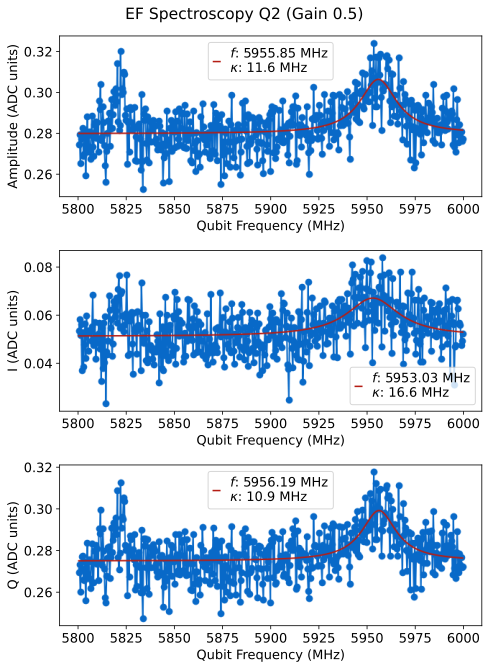

*Set cfg device.qubit 2 f_ef to 5955.8467 from 5946.7919*


In [264]:
# You may want to update this frequency, which will be the center of the scan. 
#style huge, coarse, medium, fine 
update=True

qubit_list = np.arange(3)
qubit_list=[2]
for qi in qubit_list:
    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True, 'reps':500,'gain':0.2})
    qspec=meas.QubitSpec(cfg_dict, qi=qi, style='coarse', params={'checkEF':True, "start":5800,'reps':1000,'gain':0.5, 'span':200})

    #qspec=meas.QubitSpec(cfg_dict, qi=qi, style='medium', params={'checkEF':True})#, params={'span':500, 'expts':1000,'reps':500,'gain':0.2})
    if update and qspec.status:
        auto_cfg = config.update_qubit(cfg_path, 'f_ef', qspec.data["best_fit"][2], qi)

## Rabi EF

*Set cfg device.qubit 2 ('pulses', 'pi_ef', 'sigma') to 0.005 from 0.1*
*Set cfg device.qubit 2 ('pulses', 'pi_ef', 'gain') to 0.2827 from 0.15*


  0%|          | 0/24000 [00:00<?, ?it/s]

R2:0.887	Fit par error:0.035	 Best fit:b'avgq'


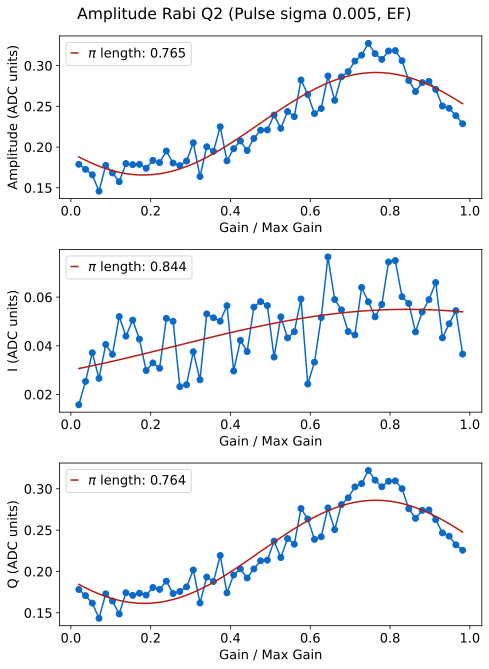

*Set cfg device.qubit 2 ('pulses', 'pi_ef', 'gain') to 0.7643 from 0.2827*


In [151]:
# If first time, initialize the sigma and gain to those of the ge 
first_time = True
update = True

qubit_list = np.arange(3)
qubit_list=[2]

bad_qubits = []
auto_cfg = config.load(cfg_path)

for qi in qubit_list: 
    if first_time:
        #config.update_qubit(cfg_path, 'f_ef', auto_cfg.device.qubit.f_spec_ef[qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','sigma'), auto_cfg['device']['qubit']['pulses']['pi_ge']['sigma'][qi], qi)
        auto_cfg = config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), auto_cfg['device']['qubit']['pulses']['pi_ge']['gain'][qi], qi)
    amp_rabi = meas.RabiExperiment(cfg_dict,qi=qi, params={'checkEF':True, 'reps':400})
    if update and amp_rabi.status:
        config.update_qubit(cfg_path, ('pulses','pi_ef','gain'), amp_rabi.data['pi_length'], qi)
    else:
        print(f'Amplitude Rabi fit failed for qubit {qi}')
        bad_qubits.append(qi)

    # MAX GAIN IS GOING TO 5 

## Qubit Temperature

  0%|          | 0/30000 [00:00<?, ?it/s]

R2:0.954	Fit par error:0.021	 Best fit:b'amps'


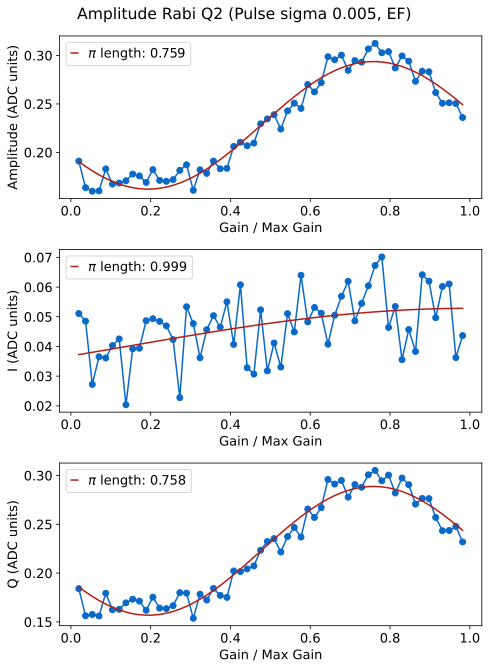

  0%|          | 0/14 [00:00<?, ?it/s]

R2:0.970	Fit par error:0.033	 Best fit:b'avgi'


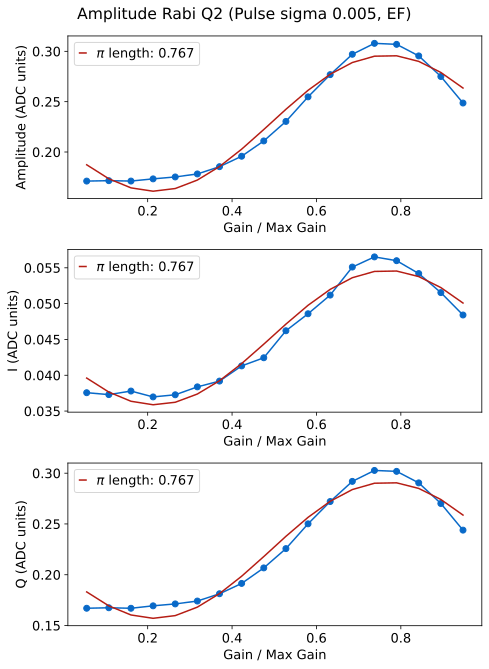

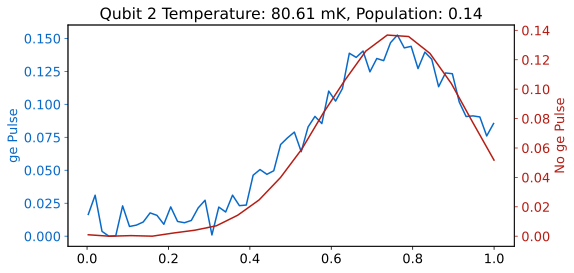

*Set cfg device.qubit 2 temp to 80.6119 from 0*
*Set cfg device.qubit 2 pop to 0.1424 from 0*


In [152]:
qubit_list = np.arange(3)
qubit_list=[2]
# Setting number of rounds multiplies the default number of rounds by that number, so can be greater than or less than 1. 
# Make sure to run single shot first 
for qi in qubit_list: 
    # rounds will make scan take longer, needed for lower temperatures. 
    temp, pop = measure_func.measure_temp(cfg_dict, qi=qi, temp=50)# , rounds=5)
    auto_cfg = config.update_qubit(cfg_path, 'temp', temp, qi)
    auto_cfg = config.update_qubit(cfg_path, 'pop', pop, qi)

## Calculate Ec and EJ

In [153]:
auto_cfg = config.load(cfg_path)
import scqubits as scq
for i in np.arange(3):
    alpha =  auto_cfg.device.qubit.f_ef[i] - auto_cfg.device.qubit.f_ge[i]
    en = scq.Transmon.find_EJ_EC(auto_cfg.device.qubit.f_ge[i]/1000,alpha/1000)
    print(alpha)
    print(en)
    q = np.pi*2 * auto_cfg.device.qubit.f_ge[i] * auto_cfg.device.qubit.T1[i]
    print(q)

-557.4786000000004
[9.08078171 0.4068679 ]
710559.8359562282
-334.72029999999995
[9.0353341  0.27579101]
959663.7906232756
-120.42720000000008
[12.95528737  0.11079468]
45049.28276000941


## Ramsey EF

In [1]:
update=True
qubit_list=np.arange(3)
qubit_list=[2]

for qi in qubit_list:
    t2r = meas.T2Experiment(cfg_dict, qi=qi, params={'checkEF':True})

    if update and t2r.status:
        config.update_qubit(cfg_path, 'f_ef', t2r.data['new_freq'], qi)
    else:
        print('T2 Ramsey fit failed')

NameError: name 'np' is not defined

# Calculate qubit params

In [ ]:

# If this is the first time you're doing this, create new file 

qubit_params.ham(cfg_path)
qubit_params.delta(cfg_path)
qubit_params.cohere(cfg_path)

# Stark

## Ramsey

### Single experiment

In [ ]:
qi=0
t2_stark = meas.RamseyStarkExperiment(cfg_dict, qi=qi, params={'stark_gain':1,'df':40,'acStark':True,'ramsey_freq':0.1, 'expts':100})

### Create stark part of config file for tracking Gain-> Freq
Only do once for each config

In [ ]:
# config.init_stark_section(cfg_dict['cfg_file'], 6)

### Sweep frequency

In [ ]:
qubit_list = np.arange(3)
qubit_list=[3]

gain = np.linspace(0.1,1,10)
for qi in qubit_list:
    for g in gain:
        t2rstark=meas.RamseyStarkFreqExperiment(cfg_dict, qi=qi, params={'step':1/430+0.001, 'stark_gain':g, 'start_df':30, 'end_df':150, 'expts_df':10})

### Calibrate stark power positive freq

You'll want to adjust the step size / expts to capture the full frequency range 

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]
d=[]
freqs= [50]
update=True
for f in freqs:
    for qi in qubit_list:
        params={'step':0.015, 'expts_gain':16, 'df':f, 'start_gain':0.035, 'end_gain':0.16,'expts':140, 'ramsey_freq':0.1}
        t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params, live_plot=True)
        d.append(t2rstark)
        if update: t2rstark.update(neg=False)

In [ ]:
plt.figure()
for i in range(len(t2rstark.data['bin_centers'])):
    plt.plot(t2rstark.data['bin_centers'][i], t2rstark.data['hist'][i])

### Negative frequency

In [ ]:
#qubit_list = np.arange(3)
update=True 
qubit_list=[0]
df = -45
for qi in qubit_list:
    params = {'step':0.015, 'expts_gain':12, 'df':df, 'start_gain':0.04, 'end_gain':0.11, 'expts':140}
    t2rstark=meas.RamseyStarkPowerExperiment(cfg_dict, qi=qi, params=params)#, live_plot=True)
    if update: t2rstark.update(neg=True)
#handy.plot_many(d, title='Ramsey Stark', save_path=cfg_dict['expt_path'])

## T1

### Single exp

In [ ]:
qi=1
gain_list = [2]
for g in gain_list:
    params = {'stark_gain':g,'df':40,'expts':60, 'span':106}
    #params={'active_reset':False, 'df':200, 'stark_gain':g,'expts':300,'start':10,'span':0,'reps':1000}
    t1 = meas.T1StarkExperiment(cfg_dict, qi=qi, params=params) 

### Gain sweep

In [ ]:
qubit_list = np.arange(3)
qubit_list=[0]

flist=[-45]
for f in flist:
    for qi in qubit_list: 
        #t1_neg = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params={'df':-70,'start_gain':0.02,'end_gain':0.2,'start':3, 'rounds':4})
        params={'df':f,'start_gain':0,'end_gain':0.14,'start':0.2, 'rounds':1,'span':103,'expts_gain':20, 'expts':80}
        t1_pos = meas.T1StarkPowerExperiment(cfg_dict, qi=qi, params=params)#, live_plot=True) 
        plt.figure()
        for i in range(len(t1_pos.data['bin_centers'])):
            plt.plot(t1_pos.data['bin_centers'][i], t1_pos.data['hist'][i])

### Freq sweep

In [ ]:
t1_freq = meas.T1StarkFreqExperiment(cfg_dict, qi=19, params={'span':6, 'span_f':100, 'start_df':50, 'expts_f':100})

### Single evo point linear gain sweep

In [ ]:
t1_cont = meas.T1StarkPowerSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':100})

### Sweep frequency linearly, 1d scan

In [ ]:
t1_quad = meas.T1StarkPowerQuadSingle(cfg_dict, qi=0, params={"rounds":1, 'wait_time':99, 'expts':300, "stop_f":3})

# It would be good to add a few excited state and ground state measurements to this. 

In [ ]:
t1_norm = -1/np.log((t1_quad_2d.data['scale_data']-shot.data['g_norm'])/shot.data['e_norm'])*tau/auto_cfg.device.qubit.T1[qi]

### Sweep frequency linearly, 2d scan sweep over time

In [ ]:
qi=0
shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False, 'reset':2})
t1 = meas.T1Experiment(cfg_dict, qi=qi)

In [ ]:
print(shot.data['g_norm'])
print(shot.data['e_norm'])

In [ ]:
print(shot.data['vg'])
print(shot.data['ve'])

### Corrected 2D scan

In [ ]:
qi = 0

#params={'wait_time':tau, "stop_f":6, 'expts':200, "sweep_pts":10, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm']}

for i in range(1):
    shot=meas.HistogramExperiment(cfg_dict, qi=qi, params={'shots':30000, 'active_reset':True,'setup_reset':False, 'reset':2})
    #shot.update()
    t1 = meas.T1Experiment(cfg_dict, qi=qi)
    t1.update()
    if t1.data['new_t1']>103:
        tau = 103
    else:
        tau = t1.data['new_t1']
    #params={"wait_time":tau, "stop_f":6, 'expts':300, "sweep_pts":15, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm'], 'vg':shot.data['vg'], 've':shot.data['ve']}
    params={"wait_time":tau, "df":6, 'expts':300, "sweep_pts":15, 'g_norm':shot.data['g_norm'], 'e_norm':shot.data['e_norm'], 'vg':shot.data['vg'], 've':shot.data['ve']}

    t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=qi,params=params)# , live_plot=True)

In [ ]:
t1_quad_2d.data['stark_gain_pts'][0]

In [ ]:
t1_quad_2d.cfg.expt.wait_time

In [ ]:
plt.figure()
for i in range(len(t1_quad_2d.data['bin_centers'])):
    #plt.plot(t1_quad_2d.data['bin_centers'][i], t1_quad_2d.data['hist'][i])
    plt.plot(t1_quad_2d.data['f_pts'][i], t1_quad_2d.data['t1_norm'][i])#+0.43*i)

In [ ]:
self.data['t1_norm'] = -1/np.log((self.data['scale_data']-self.cfg.expt['g_norm'])/self.cfg.expt['e_norm'])*self.cfg.expt.wait_time/self.cfg.device.qubit.T1[q]


In [ ]:
qi=0

tau=104
t1_quad_2d = meas.T1StarkPowerQuad2D(cfg_dict, qi=qi, params={'wait_time':tau, "stop_f":3.5, 'expts':10, "sweep_pts":100}, live_plot=True)

In [ ]:
plt.figure()
for i in range(len(t1_quad_2d.data['bin_centers'])):
    plt.plot(t1_quad_2d.data['bin_centers'][i], t1_quad_2d.data['hist'][i])

In [ ]:
plt.figure()
plt.imshow(t1_norm, aspect='auto', origin='lower')
plt.colorbar(label='avgi')
plt.xlabel('Sweep Points')
plt.ylabel('Wait Time Index')

In [ ]:
len(t1_quad_2d.data['xpts'])

In [ ]:
t1_quad_2d.data['xpts']

In [ ]:
t1_quad_2d.display()